## Import Dependencies And Files

In [1]:
import tensorflow as tf
import pandas as pd
from matplotlib import pyplot as plt
import numpy as np
import os

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [3]:
from google.colab import drive
drive.mount('/content/drive')


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
import zipfile
import os

# Path to the zip files in Google Drive
train_zip_path = '/content/drive/My Drive/Image Captioning Dataset/Train.zip'
test_zip_path = '/content/drive/My Drive/Image Captioning Dataset/Test.zip'
caption_zip_path = '/content/drive/My Drive/Image Captioning Dataset/captions.txt.zip'
glove_zip_path = '/content/drive/My Drive/Image Captioning Dataset/glove.6B.50d.txt.zip'
# Destination folder
extract_path = '/content/Dataset'

# Unzipping
with zipfile.ZipFile(train_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(test_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(caption_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)
with zipfile.ZipFile(glove_zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)


In [4]:
def ReadFile(path):
  with open(path,'r') as f:
    caption = f.read()
    return caption



## 2. Cleaning Captions

In [5]:
captions = ReadFile('/content/Dataset/captions.txt')

In [7]:
captions

'image,caption\n1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg,A girl going into a wooden building .\n1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .\n1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .\n1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .\n1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting\n1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .\n1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .\n1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .\n1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .\n1002674143_1b742ab4b8.jpg,A little girl covered in paint sits in front of a painted rainbow with her hands in a bowl .\n10026741

In [6]:
captions_list = captions.split('\n')

In [7]:
captions_list = captions_list[1:]

In [10]:
captions_list[:10]

['1000268201_693b08cb0e.jpg,A child in a pink dress is climbing up a set of stairs in an entry way .',
 '1000268201_693b08cb0e.jpg,A girl going into a wooden building .',
 '1000268201_693b08cb0e.jpg,A little girl climbing into a wooden playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl climbing the stairs to her playhouse .',
 '1000268201_693b08cb0e.jpg,A little girl in a pink dress going into a wooden cabin .',
 '1001773457_577c3a7d70.jpg,A black dog and a spotted dog are fighting',
 '1001773457_577c3a7d70.jpg,A black dog and a tri-colored dog playing with each other on the road .',
 '1001773457_577c3a7d70.jpg,A black dog and a white dog with brown spots are staring at each other in the street .',
 '1001773457_577c3a7d70.jpg,Two dogs of different breeds looking at each other on the road .',
 '1001773457_577c3a7d70.jpg,Two dogs on pavement moving toward each other .']

In [8]:
captions_dict = {}
for item in captions_list:
    if item:  # Check if item is not empty
        x = item.split(",")
        if len(x) > 1:  # Check if there's more than one element after split
            key = x[0]
            value = x[1]
            if captions_dict.get(key) is None:
                captions_dict[key] = []
            captions_dict[key].append(value)

In [12]:
captions_dict['2095078658_c14ba89bc2.jpg']

['A dog runs through snow in front of the woods .',
 'Large dog running in snow',
 'The dog runs through the snow .',
 'The German shepherd dog is running through the snow .',
 'The German Shepherd is running through the white snow .']

In [9]:
import nltk
nltk.download('stopwords') # Download stopwords if not already downloaded
from nltk.corpus import stopwords
import re




def to_lower_case(text):
    return text.lower()

def remove_punc(text):
    re.sub('[^a-z]+','', text)
    text = text.split()

    text  = [s for s in text if len(s)>1]
    text = " ".join(text)
    return text
# stopwords_list = stopwords.words('english') # Now stopwords is defined and can be used
# def remove_stopwords(text):
#     text_words = [word for word in text.split() if ((word not in stopwords_list) and (len(word) > 2))]
#     text = " ".join(text_words)
#     return text

# def remove_numbers(text):
#     return re.sub(r'[0-9]', '', text)

# def remove_multiple_spaces(text):
#     return re.sub(' +', ' ', text).strip()

def clean_text(text):

    text = to_lower_case(text)
    text = remove_punc(text)
    # text = remove_stopwords(text)
    # text = remove_numbers(text)
    # text = remove_multiple_spaces(text)
    return text

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [10]:
captions_dict_cleaned = {}
for key, values in captions_dict.items():
  cleaned_values = [clean_text(value) for value in values]
  captions_dict_cleaned[key] = cleaned_values

In [15]:
captions_dict_cleaned['2095078658_c14ba89bc2.jpg']

['dog runs through snow in front of the woods',
 'large dog running in snow',
 'the dog runs through the snow',
 'the german shepherd dog is running through the snow',
 'the german shepherd is running through the white snow']

In [16]:
len(captions_dict_cleaned.keys()), len(captions_dict_cleaned.values())

(8091, 8091)

## 3. Split Train and Test Caption

In [11]:
train_dict = {}
for img_name in os.listdir('/content/Dataset/Train/'):
  for keys, values in captions_dict_cleaned.items():
   if img_name in keys:
    train_dict[img_name] = values



In [18]:
train_dict['2095078658_c14ba89bc2.jpg']

['dog runs through snow in front of the woods',
 'large dog running in snow',
 'the dog runs through the snow',
 'the german shepherd dog is running through the snow',
 'the german shepherd is running through the white snow']

In [12]:
test_dict = {}
for img_name in os.listdir('/content/Dataset/Test/'):
 for keys, values in captions_dict_cleaned.items():
  if img_name in keys:
    test_dict[img_name] = values



In [20]:
test_dict['3582814058_564776f26c.jpg']

['group of kids and two adults stand before graffiti wall',
 'group of people standing in front of graffitied wall',
 'six individuals of varying ages stand in front of stone wall covered in graffiti',
 'six people are posing for picture in front of wall with graffiti',
 'some young boys pose with man and woman by some graffiti']

In [13]:
train_descriptions = {}
for img_name in train_dict.keys():
    train_descriptions[img_name] = []
    for cap in train_dict[img_name]:
        cap_to_append = "startseq " + cap + " endseq"
        train_descriptions[img_name].append(cap_to_append)

In [22]:
train_descriptions['2095078658_c14ba89bc2.jpg']

['startseq dog runs through snow in front of the woods endseq',
 'startseq large dog running in snow endseq',
 'startseq the dog runs through the snow endseq',
 'startseq the german shepherd dog is running through the snow endseq',
 'startseq the german shepherd is running through the white snow endseq']

In [14]:
test_descriptions = {}
for img_name in test_dict.keys():
    test_descriptions[img_name] = []
    for cap in test_dict[img_name]:
        cap_to_append = "startseq " + cap + " endseq"
        test_descriptions[img_name].append(cap_to_append)

In [24]:
test_descriptions['3582814058_564776f26c.jpg']

['startseq group of kids and two adults stand before graffiti wall endseq',
 'startseq group of people standing in front of graffitied wall endseq',
 'startseq six individuals of varying ages stand in front of stone wall covered in graffiti endseq',
 'startseq six people are posing for picture in front of wall with graffiti endseq',
 'startseq some young boys pose with man and woman by some graffiti endseq']

## Transfer Learning

In [15]:
!pip install tensorflow
!pip install keras_applications  # Add this line to install keras_applications
from tensorflow.keras.applications import inception_v3  # Update the import line

model = inception_v3.InceptionV3(weights='imagenet') # Make sure to reference correctly
model.summary()


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.7/50.7 kB 2.2 MB/s eta 0:00:00
96112376/96112376 ━━━━━━━━━━━━━━━━━━━━ 1s 0us/step


Model: "inception_v3"

┏━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)        ┃ Output Shape      ┃    Param # ┃ Connected to      ┃
┡━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━┩
│ input_layer         │ (None, 299, 299,  │          0 │ -                 │
│ (InputLayer)        │ 3)                │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d (Conv2D)     │ (None, 149, 149,  │        864 │ input_layer[0][0] │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalization │ (None, 149, 149,  │         96 │ conv2d[0][0]      │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation          │ (None, 149, 149,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_1 (Conv2D)   │ (None, 147, 147,  │      9,216 │ activation[0][0]  │
│                     │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │         96 │ conv2d_1[0][0]    │
│ (BatchNormalizatio… │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_1        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 32)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_2 (Conv2D)   │ (None, 147, 147,  │     18,432 │ activation_1[0][… │
│                     │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 147, 147,  │        192 │ conv2d_2[0][0]    │
│ (BatchNormalizatio… │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_2        │ (None, 147, 147,  │          0 │ batch_normalizat… │
│ (Activation)        │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ max_pooling2d       │ (None, 73, 73,    │          0 │ activation_2[0][… │
│ (MaxPooling2D)      │ 64)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_3 (Conv2D)   │ (None, 73, 73,    │      5,120 │ max_pooling2d[0]… │
│                     │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 73, 73,    │        240 │ conv2d_3[0][0]    │
│ (BatchNormalizatio… │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_3        │ (None, 73, 73,    │          0 │ batch_normalizat… │
│ (Activation)        │ 80)               │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ conv2d_4 (Conv2D)   │ (None, 71, 71,    │    138,240 │ activation_3[0][… │
│                     │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ batch_normalizatio… │ (None, 71, 71,    │        576 │ conv2d_4[0][0]    │
│ (BatchNormalizatio… │ 192)              │            │                   │
├─────────────────────┼───────────────────┼────────────┼───────────────────┤
│ activation_4        │ (None, 71, 71,    │          0 │ batch_normalizat

 Total params: 23,851,784 (90.99 MB)

 Trainable params: 23,817,352 (90.86 MB)

 Non-trainable params: 34,432 (134.50 KB)

In [16]:
 from tensorflow.keras.layers import MaxPooling2D
 f1 = MaxPooling2D(pool_size = (2,2), strides = (2,2))(model.layers[-3].output)

In [27]:
f1.shape

(None, 4, 4, 2048)

In [28]:
model.layers[-3].output

<KerasTensor shape=(None, 8, 8, 2048), dtype=float32, sparse=False, name=keras_tensor_310>

In [17]:
from tensorflow.keras.models import Model
model_new = Model(model.input,model.layers[-3].output)


### (i) Preprocessing Image And Vocab





In [18]:
from tensorflow.keras.preprocessing import image  # Import the image module
from tensorflow.keras.applications.inception_v3 import preprocess_input # Correct import path
def preprocess_img(img):
    img = image.load_img(img,target_size=(299,299))
    img = image.img_to_array(img)
    img = np.expand_dims(img,axis=0)
    # Normalisation
    img = preprocess_input(img)
    return img

In [19]:
def image_feature(img):
  img = preprocess_img(img)
  feature_vector = model_new.predict(img)
  feature_vector = MaxPooling2D(pool_size = (2,2), strides = (2,2))(feature_vector)
  feature_vector = tf.reshape(feature_vector,(16,2048)) # Use tf.reshape
  return feature_vector


In [20]:
vocab = set()
for key in captions_dict_cleaned.keys():
    [vocab.update(sentence.split()) for sentence in captions_dict_cleaned[key]]

print("Vocab Size(unique words In Vocab) : %d"% len(vocab))

Vocab Size(unique words In Vocab) : 8841


In [21]:
total_words = []

for key in captions_dict_cleaned.keys():
    [total_words.append(i) for des in captions_dict_cleaned[key] for i in des.split()]

print("Total Words %d"%len(total_words))

Total Words 358915


In [22]:
import collections
counter = collections.Counter(total_words)
frq_cnt = dict(counter)
print(len(frq_cnt.keys()))
# print(frq_cnt)

8841


In [23]:
# sort the dictionary according to the freq count

sorted_freq_cnt = sorted(frq_cnt.items(), reverse = True, key=lambda x:x[1])

# filter
threshold =  10
sorted_freq_cnt = [x for x in sorted_freq_cnt if x[1]>threshold]
total_words = [x[0] for x in sorted_freq_cnt]

In [24]:
word_to_idx = {}
idx_to_word = {}

for i, word in enumerate(total_words):
    word_to_idx[word] = i+1
    idx_to_word[i+1] = word

In [37]:
len(idx_to_word)

1817

In [25]:
idx_to_word[1818]  = 'startseq'
idx_to_word[1819] = 'endseq'
word_to_idx['startseq'] = 1818
word_to_idx['endseq'] = 1819

In [38]:
vocab_size =len(word_to_idx)+1
print(vocab_size)

1820


In [26]:
max_length = 0
for key in train_descriptions.keys():
  desc_list = train_descriptions[key]
  for desc in desc_list:
    max_length = max(max_length,len(desc.split()))

In [41]:
max_length

31

### (ii). Feature Extraction

In [42]:
print(max.

SyntaxError: incomplete input (<ipython-input-42-958bf84a2fb2>, line 1)

In [ ]:
import time
start =time.time()
encoding_train = {}
#image_id -->feature_vector extracted from Resnet Image
for ix, key in enumerate(train_descriptions.keys()):
    img_id = key
    img_path = '/content/Dataset/Train'+"/"+img_id
    encoding_train[img_id] = image_feature(img_path)
    if ix%100==0:
        print("Encoding in progress time step %d "%ix)
end_t = time()
print("Total Time Taken :",end_t-start)

In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_train.pkl'

# Deserialization
with open(file_path, 'wb') as file:
  pickle.dump(encoding_train,file)

print("Loaded 'encoding_train' successfully.")


In [27]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_train.pkl'

# Deserialization
with open(file_path, 'rb') as file:
    encoding_train = pickle.load(file)

print("Loaded 'encoding_train' successfully.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


In [ ]:
import time
start =time.time()
encoding_test = {}
#image_id -->feature_vector extracted from Resnet Image
for ix, key in enumerate(test_descriptions.keys()):
    img_id = key
    img_path = '/content/Dataset/Test'+"/"+img_id
    encoding_test[img_id] = image_feature(img_path)
    if ix%100==0:
        print("Encoding in progress time step %d "%ix)
end_t = time()
print("Total Time Taken :",end_t-start)

In [ ]:
print(encoding_test)

In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_test.pkl'

# Deserialization
with open(file_path, 'wb') as file:
   pickle.dump(encoding_test,file)

print("Loaded 'encoding_train' successfully.")


In [ ]:
with open(file_path, 'rb') as file:
    loaded_dict = pickle.load(file)

# Peek into the shape of one feature vector
for key, value in loaded_dict.items():
    print(key, value.shape)
    break  # just check the first one


In [28]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_test.pkl'

# Deserialization
with open(file_path, 'rb') as file:
    encoding_test = pickle.load(file)

print("Loaded 'encoding_train' successfully.")


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Loaded 'encoding_train' successfully.


## 4. Building Custom Generator

In [45]:
        for key,captions in train_descriptions.items():

            if key in encoding_train:
              photo = encoding_train[key]
print(photo)

tf.Tensor(
[[0.         0.16273978 0.         ... 0.7501637  0.5411122  0.47485653]
 [0.3768319  0.2543558  1.1116737  ... 1.268674   0.4716038  0.1913112 ]
 [0.         0.         0.6192257  ... 0.91211987 0.3285754  0.54912025]
 ...
 [1.1798097  0.         0.17206591 ... 0.         2.0326986  4.1063557 ]
 [0.54567647 1.1034218  0.         ... 0.         1.9177231  3.422125  ]
 [1.122054   1.0464896  0.         ... 0.         2.4066205  3.2619393 ]], shape=(16, 2048), dtype=float32)


In [29]:
def data_generator(descriptions,encoding,word_to_idx,max_length,batch_size):
    X1,X2, y = [],[],[]

    n =0
    while True:
        for key,captions in descriptions.items():
            n += 1
            if key in encoding:
              photo = encoding[key]
            for caption in captions:

                seq = [word_to_idx[word] for word in caption.split() if word in word_to_idx]
                if not seq:
                    continue


                for i in range(1,len(seq)):
                    xi = seq[0:i]
                    yi = seq[i]

                    #0 denote padding word
                    xi = pad_sequences([xi],maxlen=max_length,value=0,padding='post')[0]
                    yi = to_categorical([yi],num_classes=vocab_size)[0]

                    X1.append(photo)
                    X2.append(xi)
                    y.append(yi)

                if n==batch_size:
                    yield (
                        (np.array(X1), np.array(X2)),
                        np.array(y)
                    )
                    X1,X2,y = [],[],[]
                    n = 0
        if X1:
            yield ((np.array(X1), np.array(X2)), np.array(y))
            X1, X2, y = [], [], []
            n = 0


## 5. Word Embedding

In [30]:
embedding = {}
with open('/content/Dataset/glove.6B.50d.txt') as f:
  for line in f:
    values = line.split()
    word = values[0]
    word_embedding = np.array(values[1:],dtype='float')
    embedding[word] = word_embedding

In [31]:
def get_embedding_matrix():
    emb_dim = 50
    matrix = np.zeros((vocab_size,emb_dim))
    for word,idx in word_to_idx.items():
        embedding_vector = embedding.get(word)

        if embedding_vector is not None:
            matrix[idx] = embedding_vector

    return matrix

## 6. Model Architecture

In [32]:
from tensorflow.keras.layers import Input, Dropout, Dense, Embedding, LSTM, add, Dot,concatenate, Reshape
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.layers import Bidirectional, RepeatVector,Lambda, Activation


In [33]:
input_img_vector = Input(shape=(16,2048))
img_branch = Dropout(0.3)(input_img_vector)
img_branch = Dense(256,activation='relu')(img_branch)
# imgbranch_projected = Bidirectional(LSTM(256, return_sequences=True))(imgbranch_projected)

In [ ]:
img_branch.shape

In [ ]:
caption_branch.shape

In [34]:
input_captions = Input(shape=(31,))
caption_branch = Embedding(1820,50,mask_zero=True)(input_captions)
caption_branch = Dropout(0.3)(caption_branch)
caption_branch = LSTM(256, return_sequences=True)(caption_branch)
capbranch_projected = Bidirectional(LSTM(256))(caption_branch)


In [ ]:
print(caption_branch.shape)

In [ ]:
from tensorflow.keras.layers import Layer # Import Layer
class AttentionLayer(Layer):
    def __init__(self, units):
        super(AttentionLayer, self).__init__()
        self.W1 = Dense(units)
        self.W2 = Dense(units)
        self.V = Dense(1)

    def call(self, inputs):
        caption_branch, img_branch = inputs

        # Expand dimensions for broadcasting
        caption_branch_exp = tf.expand_dims(self.W1(caption_branch), 2)  # (None, 31, 1, units)
        img_branch_exp     = tf.expand_dims(self.W2(img_branch), 1)  # (None, 1, 64, units)

        # Broadcast + tanh + score
        attention_layer = tf.nn.tanh(caption_branch_exp + img_branch_exp)  # (None, 31, 64, units)
        score = self.V(attention_layer)  # (None, 31, 64, 1)

        attention_weights = tf.nn.softmax(score, axis=2)  # softmax over image regions (64)

        # Context vector: weighted sum of image features
        context_vector = attention_weights * tf.expand_dims(img_branch, 1)  # (None, 31, 64, 256)
        context_vector = tf.reduce_sum(context_vector, axis=2)  # (None, 31, 256)
        context_vector = tf.reduce_sum(context_vector, axis=1)

        return context_vector


In [ ]:
        attention = Dot(axes=[2, 2])([img_branch, caption_branch])  # Calculate attention scores

        # Softmax attention scores
        attention_scores = Activation('softmax')(attention)
        print(attention.shape)
        print(attention_scores.shape)


In [ ]:
from tensorflow.keras.layers import Layer
import tensorflow as tf

class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()
        # No Dense layers needed for dot-product attention

    def call(self, inputs):
        caption_branch, img_branch = inputs
        # caption_branch: (batch_size, seq_len, hidden_dim), e.g., (None, 31, 256)
        # img_branch: (batch_size, num_regions, feature_dim), e.g., (None, 64, 256)

        # Compute attention scores: dot product between caption and image features
       # Apply attention mechanism using Dot product
        attention = Dot(axes=[2, 2])([img_branch, caption_branch])  # Calculate attention scores

        # Softmax attention scores
        attention_scores = Activation('softmax')(attention)

        # Example: (None, 64, 256) @ (None, 31, 256) -> (None, 64, 31)


        attention_context = tf.einsum('ijk,ijl->ikl', attention_scores, img_branch)

              # Example: (None, 64, 31) @ (None, 64, 256) -> (None, 31, 256)
        context_vector = tf.reduce_sum(context_vector, axis=1)  # (batch_size, feature_dim)
        # Example: (None, 31, 256) -> (None, 256)
        return context_vector

In [36]:
attention_ = AttentionLayer()([caption_branch, img_branch])

/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'attention_layer' (of type AttentionLayer) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


In [35]:
from tensorflow.keras.layers import Layer
import tensorflow as tf

class AttentionLayer(Layer):
    def __init__(self):
        super(AttentionLayer, self).__init__()

    def call(self, inputs):
        caption_branch, img_branch = inputs
        # caption_branch: (batch_size, seq_len, hidden_dim), e.g., (None, 31, 256)
        # img_branch: (batch_size, num_regions, feature_dim), e.g., (None, 64, 256)

        # Compute attention scores: dot product between caption and image features
        attention = tf.matmul(caption_branch, img_branch, transpose_b=True)  # (None, 31, 64)

        # Softmax attention scores
        attention_scores = tf.nn.softmax(attention, axis=2)  # (None, 31, 64)

        # Context vector: weighted sum of image features
        context_vector = tf.matmul(attention_scores, img_branch)  # (batch_size, 31, 256)

        # Sum over the sequence length to get a single context vector for the image
        context_vector = tf.reduce_sum(context_vector, axis=1)  # (batch_size, 256)

        return context_vector

In [39]:
merged = concatenate([attention_,capbranch_projected]) # Use concatenate instead of add
decoder = Dense(256,activation='relu')(merged)
outputs = Dense(vocab_size,activation='softmax')(decoder)

# Combined Model
cap_model = Model(inputs=[input_img_vector,input_captions],outputs=outputs)

In [ ]:
cap_model.summary()

In [ ]:
from tensorflow.keras.utils import to_categorical, plot_model
plot_model(cap_model, show_shapes=True)


In [55]:
cap_model.layers[1].set_weights([get_embedding_matrix()])


In [ ]:
get_embedding_matrix().shape

In [ ]:
cap_model.compile(loss='categorical_crossentropy',optimizer="adam")


In [57]:

batch_size = 32


In [58]:
modelcheckpoint = tf.keras.callbacks.ModelCheckpoint(
    '/content/drive/MyDrive/Image Captioning Dataset/model.weights.h5',
    verbose=1,
    save_best_only=False,
    save_weights_only=True
)

In [ ]:

steps_per_epoch = len(train_descriptions) // batch_size
validation_steps = len(test_descriptions) // batch_size
train_generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_length, batch_size)
test_generator = data_generator(test_descriptions, encoding_test, word_to_idx, max_length, batch_size)

cap_model.fit(
    train_generator,
    epochs = 50,
    steps_per_epoch=steps_per_epoch,# Limit iterations per epoch
    validation_data = test_generator,
    validation_steps = validation_steps,
    verbose=1,
    callbacks = [modelcheckpoint]
)

In [40]:
cap_model.load_weights( '/content/drive/MyDrive/Image Captioning Dataset/model.weights.h5')

In [61]:

steps_per_epoch = len(train_descriptions) // batch_size
validation_steps = len(test_descriptions) // batch_size
train_generator = data_generator(train_descriptions, encoding_train, word_to_idx, max_length, batch_size)
test_generator = data_generator(test_descriptions, encoding_test, word_to_idx, max_length, batch_size)

cap_model.fit(
    train_generator,
    epochs = 50,
    steps_per_epoch=steps_per_epoch,# Limit iterations per epoch
    validation_data = test_generator,
    validation_steps = validation_steps,
    initial_epoch = 33,
    verbose=1,
    callbacks = [modelcheckpoint]
)

Epoch 34/50


/usr/local/lib/python3.11/dist-packages/keras/src/layers/layer.py:938: UserWarning: Layer 'attention_layer' (of type AttentionLayer) was passed an input with a mask attached to it. However, this layer does not support masking and will therefore destroy the mask information. Downstream layers will not see the mask.
  warnings.warn(


215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 463ms/step - loss: 2.4034
Epoch 34: saving model to /content/drive/MyDrive/Image Captioning Dataset/model.weights.h5
215/215 ━━━━━━━━━━━━━━━━━━━━ 126s 542ms/step - loss: 2.4035 - val_loss: 3.7430
Epoch 35/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 404ms/step - loss: 2.2626
Epoch 35: saving model to /content/drive/MyDrive/Image Captioning Dataset/model.weights.h5
215/215 ━━━━━━━━━━━━━━━━━━━━ 102s 476ms/step - loss: 2.2627 - val_loss: 3.8295
Epoch 36/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 405ms/step - loss: 2.2149
Epoch 36: saving model to /content/drive/MyDrive/Image Captioning Dataset/model.weights.h5
215/215 ━━━━━━━━━━━━━━━━━━━━ 141s 659ms/step - loss: 2.2149 - val_loss: 3.8751
Epoch 37/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 402ms/step - loss: 2.1787
Epoch 37: saving model to /content/drive/MyDrive/Image Captioning Dataset/model.weights.h5
215/215 ━━━━━━━━━━━━━━━━━━━━ 142s 663ms/step - loss: 2.1788 - val_loss: 3.9628
Epoch 38/50
215/215 ━━━━━━━━━━━━━━━━━━━━ 0s 403ms/st

In [ ]:
def data_generator(descriptions, encoding, word_to_idx, max_length, batch_size):
    # Initialize X1, X2, y outside the while loop
    X1, X2, y = [], [], []
    n = 0
    while True:
        for key, captions in descriptions.items():
            n += 1
            # Check if key exists in encoding and if the value is not None
            if key in encoding and encoding[key] is not None:
                photo = encoding[key]
                for caption in captions:
                    seq = [word_to_idx[word] for word in caption.split() if word in word_to_idx]
                    if not seq:
                        continue
                    for i in range(1, len(seq)):
                        xi = seq[0:i]
                        yi = seq[i]
                        # 0 denote padding word
                        xi = pad_sequences([xi], maxlen=max_length, value=0, padding='post')[0]
                        yi = to_categorical([yi], num_classes=vocab_size)[0]
                        X1.append(photo)
                        X2.append(xi)
                        y.append(yi)
                    # Yield data even if n is less than batch_size to prevent empty batches
                    if n == batch_size: #or key == list(descriptions.keys())[-1] and caption == captions[-1]:
                        yield ((np.array(X1), np.array(X2)), np.array(y))
                        # Reset X1, X2, y after yielding the batch
                        X1, X2, y = [], [], []
                        n = 0
        # Yield remaining data if any at the end of an epoch
        if X1:
            yield ((np.array(X1), np.array(X2)), np.array(y))
            X1, X2, y = [], [], []
            n = 0

In [ ]:
def data_generator(descriptions, encoding, word_to_idx, max_length, batch_size):
    # Initialize X1, X2, y outside the while loop
    X1, X2, y = [], [], []
    n = 0
    while True:
        for key, captions in descriptions.items():
            n += 1
            # Check if key exists in encoding and if the value is not None
            if key in encoding and encoding[key] is not None:
                photo = encoding[key]
                for caption in captions:
                    seq = [word_to_idx[word] for word in caption.split() if word in word_to_idx]
                    if not seq:
                        continue
                    for i in range(1, len(seq)):
                        xi = seq[0:i]
                        yi = seq[i]
                        # 0 denote padding word
                        xi = pad_sequences([xi], maxlen=max_length, value=0, padding='post')[0]
                        yi = to_categorical([yi], num_classes=vocab_size)[0]
                        X1.append(photo)
                        X2.append(xi)
                        y.append(yi)
                    if n == batch_size:
                        yield ((np.array(X1), np.array(X2)), np.array(y))
                        # Reset X1, X2, y after yielding the batch
                        X1, X2, y = [], [], []
                        n = 0

In [ ]:
# prompt: plot val_loss and loss

import matplotlib.pyplot as plt

# Assuming 'history' object contains the training history from model.fit
# history = cap_model.fit(...)

# Access the loss and validation loss
loss = cap_model.history.history['loss']
val_loss = cap_model.history.history['val_loss']

# Plot the loss and validation loss
epochs = range(1, len(loss) + 1)
plt.plot(epochs, loss, 'b', label='Training Loss')
plt.plot(epochs, val_loss, 'r', label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.show()


In [ ]:
import pickle
from google.colab import drive

# Mount Google Drive
drive.mount('/content/drive')

# Load the dictionary from the saved file
file_path = '/content/drive/My Drive/encoding_train.pkl'  # Ensure this path is correct

# Deserialization
with open(file_path, 'rb') as file:
    encoding_train = pickle.load(file)

print("Loaded 'encoding_train' successfully.")

In [ ]:

cap_model.save_weights('/content/drive/MyDrive/Image Captioning Dataset/model.weights.h5')


In [47]:
def predict_caption(photo, model):

    caption = "startseq"
    for i in range(22):
        sequence = [word_to_idx[w] for w in caption.split() if w in word_to_idx]
        sequence = pad_sequences([sequence],maxlen=31,padding='post')
        photo = photo.reshape(1, 16, 2048)

        ypred = model.predict([photo,sequence])
        ypred = ypred.argmax()
        predicted_word = idx_to_word[ypred]
        caption += ' ' + predicted_word




        if predicted_word == "endseq":
            break


    return caption


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 416ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 68ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 53ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 54ms/step
startseq two children are jumping off the sidewalk endseq


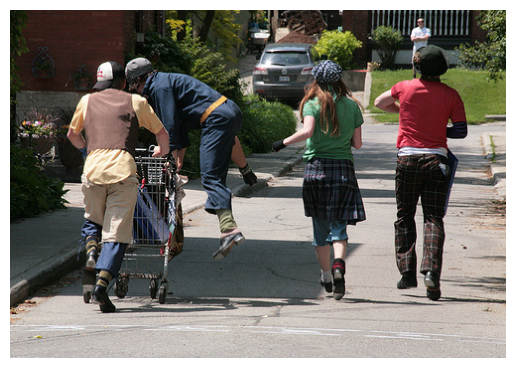

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 295ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
startseq man in an orange shirt and man in white shirt are on skateboard endseq


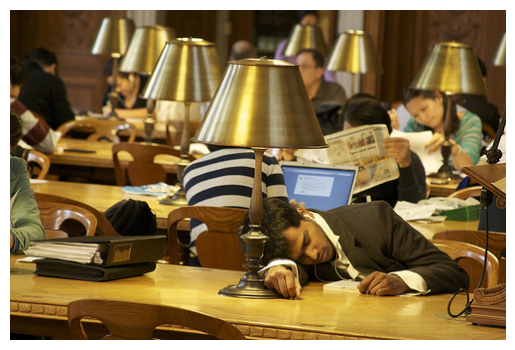

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 271ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 55ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
startseq two children are riding in red roller truck endseq


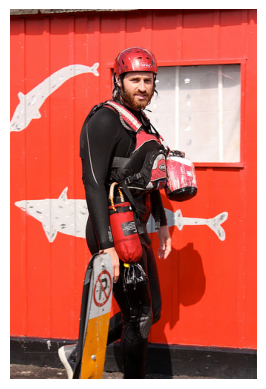

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 240ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 70ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
startseq man in blue shirt is throwing dogs with the air endseq


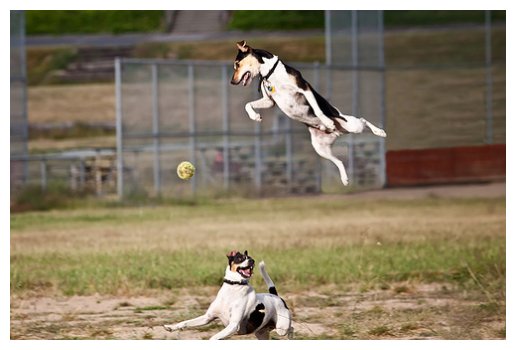

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 268ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
startseq man in blue shirt and woman in black shirt and tie are standing in front of an building endseq


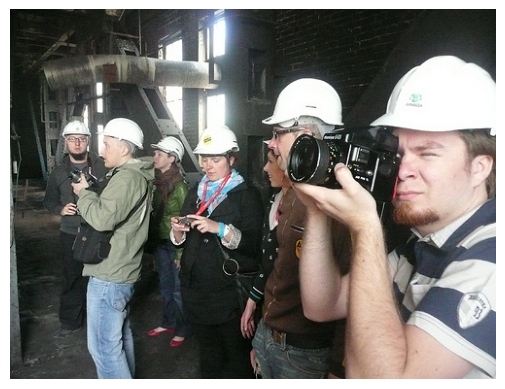

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 286ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 59ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 58ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 96ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 97ms/step
startseq two on bmx vehicles endseq


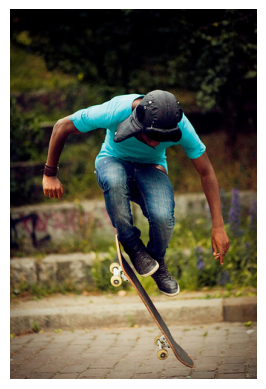

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 440ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 114ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 99ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 112ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 117ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 93ms/step
startseq two people are standing on the ground in front of brick endseq


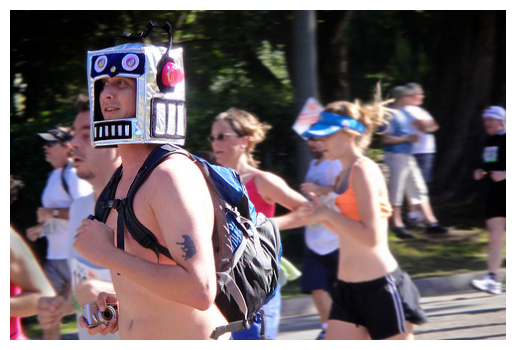

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 272ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
startseq brown dog is standing on the grass endseq


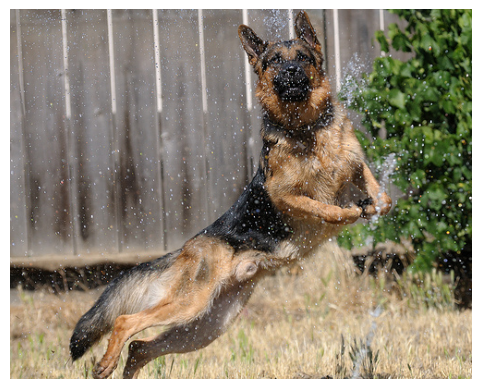

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 267ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 57ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 81ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 73ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
startseq man in white shirt and cap is holding football to his head endseq


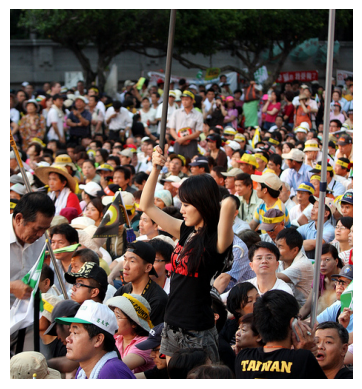

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 266ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 61ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 78ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 56ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 62ms/step
startseq man in yellow shirt is surfing past an endseq


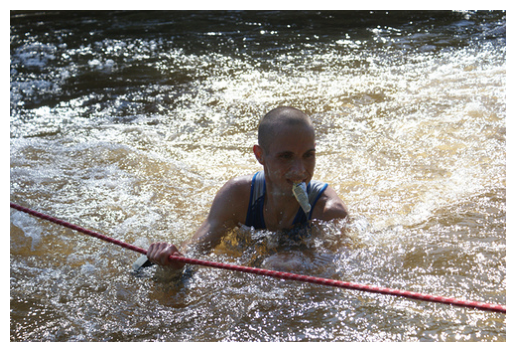

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 300ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 74ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 63ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 66ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
startseq two people are standing in the snow endseq


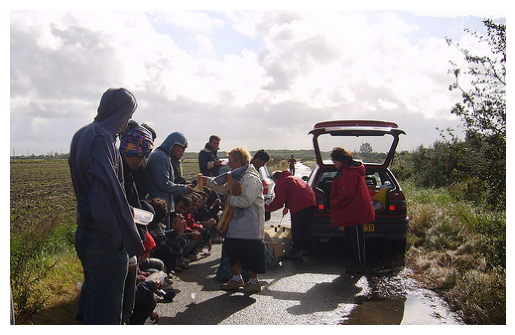

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 280ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 77ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 85ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 80ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 69ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
startseq the dog is jumping into the air endseq


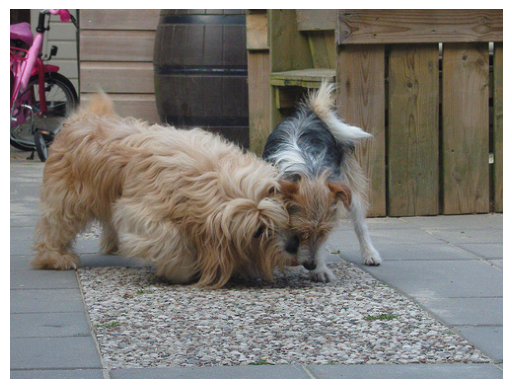

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 287ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 105ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 102ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 138ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 142ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 113ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 115ms/step
startseq young boy is walking with yellow ball in his mouth endseq


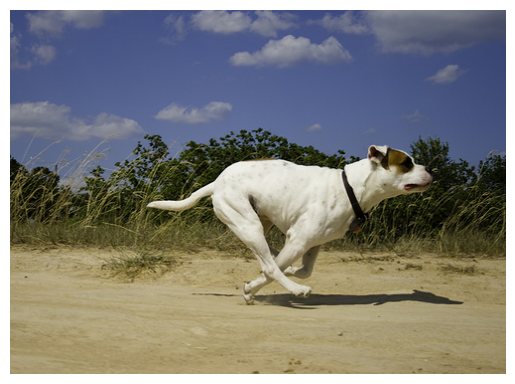

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 528ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 104ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 91ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 109ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 127ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 144ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 158ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
startseq young child is walking on the at beach endseq


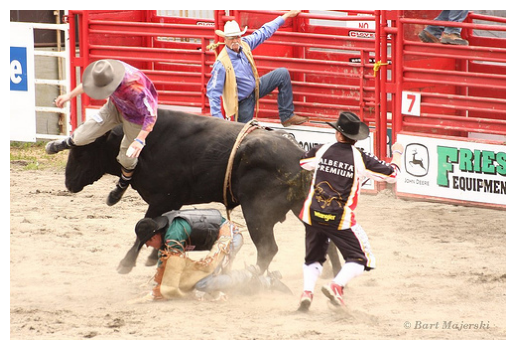

1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 306ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 86ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 95ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 67ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 79ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 82ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 72ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 60ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 64ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 98ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 65ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 100ms/step
startseq man is standing on the field with his arms on blue and green brick wall endseq


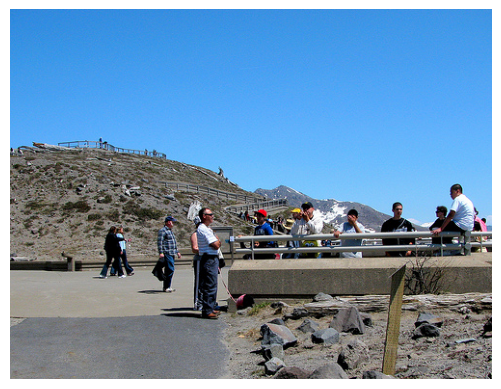

In [48]:
import matplotlib.pyplot as plt
import seaborn as sns # Import seaborn


sns.set_theme(style="darkgrid") # Use seaborn to set the style

for i in range(15):
    idx = np.random.randint(0,1000)
    all_img_names = list(test_dict.keys())
    img_name = all_img_names[idx]
    photo_2048 = image_feature(os.path.join("Dataset","Test",img_name)).numpy().reshape((16,2048))

    i = plt.imread("Dataset/Test/"+img_name)

    caption = predict_caption(photo_2048,cap_model)
    print(caption)

    # plt.title(caption)
    plt.imshow(i)
    plt.axis("off")
    plt.show()
